# Анализ рынка заведений общественного питания Москвы

## Обзор данных

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
import warnings 
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
warnings.filterwarnings("ignore")

In [2]:
# настройки для графиков
%config InlineBackend.figure_format = 'retina'

plt.style.use('seaborn-pastel')
sns.set(rc={'figure.figsize':(8,4)})
sns.set_style('darkgrid')
sns.set_palette('Pastel1')

In [3]:
# открытие файла
data = pd.read_csv('E:\My Documents\Studying\Data_Analyst\Projects\pr_11_catering_market\moscow_places.csv')

In [4]:
# вывод основной информации о датафреймах, подсчет дубликатов и пропусков
def df_info(data: pd.DataFrame):
    print('Первые 10 строк датафрейма')
    display(data.head(10))
    print('Основная информация о датафрейме')
    display(data.info())
    print('Описание данных')
    display(data.describe())
    print('Количество строк-дубликатов')
    display(data.duplicated().sum())
    print('Количество пропусков')
    display(data.isna().sum())

df_info(data)

Первые 10 строк датафрейма


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Основная информация о датафрейме
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Описание данных


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Количество строк-дубликатов


0

Количество пропусков


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [5]:
# расчет количества заведений
data['name'].nunique()

5614

In [6]:
# сохранение первоначального количества строк в переменной
old_data = data.shape[0]

На основании полученной информации можно сделать следующие выводы:
- всего в датасете содержится информация о 5614 заведениях;
- у некоторых столбцов неверно определен тип данных;
- явные дубликаты отсутствуют;
- присутствуют пропуски значений в столбцах.

Необходима предобработка данных для устранения вышеуказанных проблем и более детальной обработки столбцов.

## Предобработка данных

Для того, чтобы проверить, есть ли в датасете неявные дубликаты, необходимо привести названия заведений к единому регистру, например, к верхнему.

In [7]:
# приведение названий заведений к верхнему регистру
data['name'] = data['name'].str.upper()

In [8]:
# подсчет дубликатов по названию заведения и его адресу
data.duplicated(subset=['name', 'address']).sum()

3

Обнаружено 3 дубликата, избавимся от них.

In [9]:
# удаление строк с дубликатами
data = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)

Посмотрим, есть ли пропуски в столбцах с оценкой среднего чека и одной чашки капучино, у заведений, где указана средняя стоимость заказа.

In [10]:
# вывод строк с пропуском в оценке среднего чека для заведений, где указан средний счет
data.loc[(data['middle_avg_bill'].isna()) & (data['avg_bill'].str.contains('счёт'))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [11]:
# вывод строк с пропуском в оценке среднего чека для заведений, где указана цена чашки капучино
data.loc[(data['middle_coffee_cup'].isna()) & (data['avg_bill'].str.contains('чашки'))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Таких строк нет, поэтому заполнить пропуски в столбцах с оценкой среднего чека и одной чашки капучино не представляется возможным.

По остальным столбцам заполнение пропусков может привести к искажению данных, а удаление строк с пропусками - к большой потери данных, поэтому оставим их без изменений.

Также, в предыдущем разделе были обнаружены аномально высокие (>1000) значения количества посадочных мест у нескольких заведений. Посмотрим на количество таких заведений.

In [12]:
# вывод строк с количеством посадочных мест > 1000
data.loc[data['seats'] > 1000, 'name'].count()

16

В целом, их немного, поэтому имеет смысл удалить их из датасета во избежание искажения анализа.

In [13]:
# удаление строк с количеством посадочных мест > 1000
data = data.query('seats < 1000 or seats.isna()')

In [14]:
# подсчет уникальных значений в столбце с категорией заведения
data['category'].value_counts()

кафе               2374
ресторан           2038
кофейня            1410
бар,паб             761
пиццерия            632
быстрое питание     602
столовая            314
булочная            256
Name: category, dtype: int64

In [15]:
# подсчет уникальных значений в столбце с рейтингом заведения
data['rating'].value_counts().sort_values()

1.2       1
1.5       2
1.6       2
1.8       2
1.9       4
2.1       4
2.0       4
1.7       6
1.0      10
1.3      11
2.4      11
2.7      11
1.4      11
2.2      13
2.5      14
2.3      14
1.1      14
2.6      15
3.0      24
2.8      30
2.9      31
3.1      37
3.2      41
3.3      54
3.4      68
3.5      72
3.6      75
5.0     105
3.7     147
3.8     188
4.8     214
4.9     243
3.9     252
4.6     422
4.7     439
4.0     497
4.5     621
4.1     781
4.2    1038
4.4    1349
4.3    1510
Name: rating, dtype: int64

In [16]:
# подсчет уникальных значений в столбце с названием округа
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             838
Восточный административный округ            794
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [17]:
# изменение типа данных у столбца с признаком, который показывает, является ли заведение сетевым
data['chain'] = data['chain'].astype('bool')

In [18]:
# добавление столбца с названием улиц из столбца с адресом
def add_street(address):
    splited_address = address.split(', ')
    return splited_address[1]

data['street'] = data['address'].apply(add_street)

In [19]:
# добавление столбца с обозначением, что заведение работает ежедневно и круглосуточно
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [20]:
# расчет отношения количества строк после проведения предобработки
# к изначальному количеству строк
data.shape[0] / old_data

0.9977397097311445

Таким образом, в данном разделе был изменен тип данных в столбце датафрейма c признаком, который показывает, является ли заведение сетевым, были добавлены необходимые для работы столбцы, а также устранены неявные дубликаты и рассмотрены уникальные значения столбцов с категорией, рейтингом заведения и названием округа.

Количество удаленных данных составило менее 1% от исходного датасета.

## Анализ данных

В предыдущем разделе было определено, что в датасете представлены следующие категории заведений: 
- кафе;
- ресторан;
- кофейня;
- бар, паб;
- пиццерия;
- быстрое питание;
- столовая;
- булочная. 

Исследуем их количество.

In [21]:
# создание таблицы с количеством заведений по категориям
df_category = data.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False).reset_index(drop=True)
df_category.columns = ['category', 'amount']

In [22]:
# построение столбчатой диаграммы по количеству заведений по категориям
fig = px.bar(
    df_category, 
    x='amount', 
    y='category',
    color='category',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Количество заведений по категориям',
    title_x = 0.5,
    xaxis_title='Количество заведений',
    yaxis_title='Название категории',
    yaxis={'categoryorder':'total ascending'},
    showlegend=False
)
fig.show()

Наибольшую долю составляют рестораны (28,3%) и кафе (24,3%). Наименьшую долю - столовые (3,7%) и булочные (3,1%). 

Посмотрим на количество посадочных мест по категориям.

In [23]:
# создание таблицы с количеством посадочных мест по категориям
category_seats = data.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False).reset_index(drop=True)
category_seats.columns = ['category', 'seats']

In [24]:
# построение столбчатой диаграммы по количеству посадочных мест по категориям
fig = px.bar(
    category_seats, 
    x='seats', 
    y='category',
    color='category',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Медианное количество посадочных мест по категориям',
    title_x = 0.5,
    xaxis_title='Количество посадочных мест',
    yaxis_title='Название категории',
    yaxis={'categoryorder':'total ascending'},
    showlegend=False
)
fig.show()

Наибольшее количество посадочных мест в ресторанах, а наименьшее в булочных и пиццериях.

Рассмотрим соотношение сетевых и несетевых заведений.

In [25]:
# создание таблицы с количеством заведений по признаку, который показывает, является ли заведение сетевым
df_chain = data.groupby('chain', as_index=False)['name'].count().sort_values(by='name', ascending=False).reset_index(drop=True)
df_chain.columns = ['chain', 'amount']

In [26]:
# построение круговой диаграммы по количеству заведений по признаку, который показывает, является ли заведение сетевым
colors = ['#fbb4ae', '#b3cde3', '#ccebc5', '#decbe4', '#fed9a6', '#ffffcc', '#e5d8bd', '#fddaec', '#f2f2f2', '#b3e2cd', '#fdcdac', '#cbd5e8', '#f4cae4', '#e6f5c9', '#fff2ae', '#f1e2cc', '#cccccc']
fig = go.Figure(data=[go.Pie(labels=df_chain['chain'], values=df_chain['amount'], marker=dict(colors=colors))])
fig.update_layout(
    title='Круговая диаграмма с долями сетевых/несетевых заведений',
    title_x = 0.45
)

На основании диаграммы можно сделать вывод о том, что 61,9% заведений общественного питания не являются частью каких-либо сетей.

Посмотрим, какие категории заведений чаще являются сетевыми.

In [27]:
# создание таблицы с количеством сетевых заведений по категориям
categories_chain = data.groupby(['category', 'chain'], as_index=False)['name'].count()
categories_chain.columns = ['category', 'chain', 'amount']

In [28]:
# построение столбчатой диаграммы по количеству сетевых/несетевых заведений по категориям
fig = px.bar(
    categories_chain, 
    x='category', 
    y='amount',
    color='chain',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Количество сетевых/несетевых заведений по категориям',
    title_x = 0.5,
    xaxis_title='Название категории',
    yaxis_title='Количество заведений',
    xaxis={'categoryorder':'total descending'}
)
fig.show()

Сетевыми заведениями чаще являются булочные, кофейни и пиццерии.

Составим топ-15 наиболее популярных сетей в Москве.

In [29]:
# создание таблицы с топ-15 популярных сетей
df_name = data.query('chain == True').groupby('name', as_index=False)['chain'].count().sort_values(by='chain', ascending=False).reset_index(drop=True)
df_name.columns = ['name', 'amount']
df_name = df_name[0:15]

In [30]:
# построение столбчатой диаграммы с топ-15 популярных сетей
fig = px.bar(
    df_name, 
    x='amount', 
    y='name',
    color='name',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Топ-15 популярных сетей по количеству заведений',
    title_x = 0.5,
    xaxis_title='Количество заведений',
    yaxis_title='Название сети',
    yaxis={'categoryorder':'total ascending'},
    showlegend=False
)
fig.show()

Однозначным лидером является сеть "Шоколадница", а замыкает топ-15 сеть заведений общественного питания "Му-му". Большинство заведений имеет невысокий прайс, этим обусловлено большое количество клиентов, что, в свою очередь, объясняет количество открытых точек.

В предыдущем разделе был рассмотрен перечень округов Москвы из датасета:

- Центральный административный округ;
- Северный административный округ;
- Южный административный округ;
- Северо-Восточный административный округ;
- Западный административный округ;
- Восточный административный округ;
- Юго-Восточный административный округ;
- Юго-Западный административный округ;
- Северо-Западный административный округ.

Посмотрим на общее количество заведений и количество заведений каждой категории по районам.

In [31]:
# создание таблицы с количеством заведений по округам
df_district = data.groupby('district', as_index=False)['name'].count()
df_district.columns = ['district', 'total_amount']

# создание таблицы с количеством заведений по округам и категориям
df_dist_cat = data.groupby(['district', 'category'], as_index=False)['name'].count()
df_dist_cat.columns = ['district', 'category', 'amount']

# объединение таблиц
df_d = df_dist_cat.merge(df_district, on='district')

In [32]:
# построение столбчатой диаграммы с количеством заведений по округам
fig = px.bar(
    df_d, 
    x='amount', 
    y='district',                    
    color='category',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Количество заведений по округам',
    title_x = 0.5,
    xaxis_title='Количество заведений',
    yaxis_title='Название округа',
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

Однозначно лидирует ЦАО с 2242 заведениями, где бОльшую долю занимают рестораны.

Исследуем распределение средних рейтингов по категориям заведений.

In [33]:
# создание таблицы со средним рейтингом по категориям
categories_rating = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False).reset_index(drop=True)

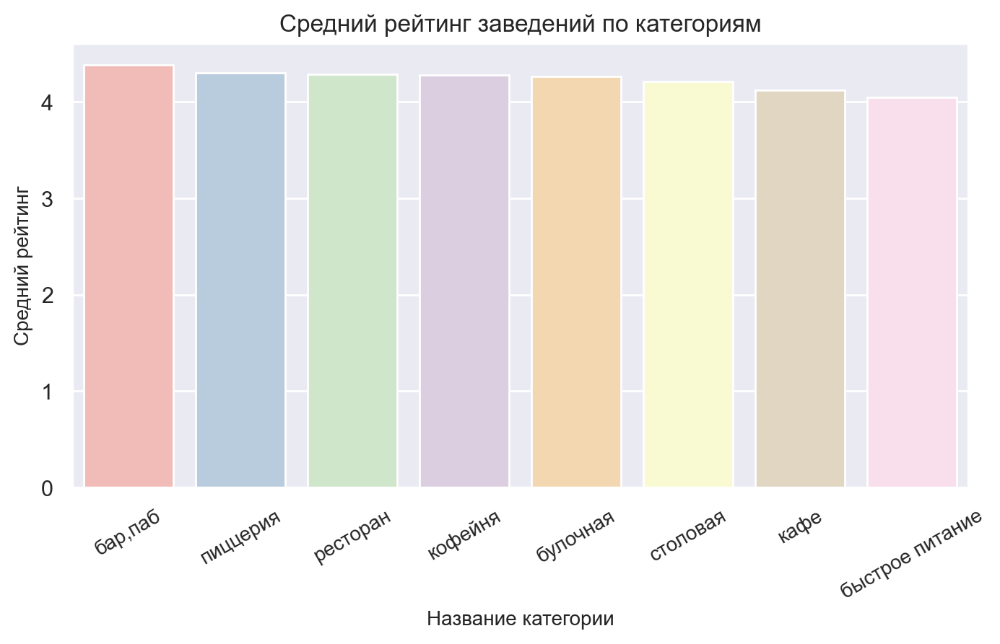

In [34]:
# построение столбчатой диаграммы по среднему рейтингу по категориям
sns.barplot(data=categories_rating, x='category', y='rating')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Название категории', fontsize=10)
plt.ylabel('Средний рейтинг', fontsize=10)
plt.xticks(fontsize=10, rotation=30);

Средний рейтинг всех категорий заведений общественного питания превышает оценку 4.0, но наиболее высокое значение (4.4) у баров, пабов.

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [35]:
# создание таблицы со средним рейтингом по округам
district_rating = data.groupby('district', as_index=False)['rating'].mean()

In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng])

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг у заведений Центрального административного округа, а самый низкий у Юго-Восточного административного округа.

Отобразим все заведения датасета на карте.

In [37]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Составим топ-15 улиц по количеству заведений.

In [38]:
# создание таблицы с количеством заведений по улицам
df_street = data.groupby('street', as_index=False)['name'].count()
df_street.columns = ['street', 'total_amount']

# создание таблицы с топ-15 улиц по заведениям
df_street_top = df_street.sort_values(by='total_amount', ascending=False).reset_index(drop=True)
df_street_top = df_street_top[0:15]

# создание таблицы с количеством заведений по улицам и категориям
df_str_cat = data.groupby(['street', 'category'], as_index=False)['name'].count()
df_str_cat.columns = ['street', 'category', 'amount']

# объединение таблиц
df_s = df_str_cat.merge(df_street_top, on='street')

In [39]:
# построение столбчатой диаграммы топ-15 улиц по количеству заведений
fig = px.bar(
    df_s, 
    x='amount', 
    y='street',                    
    color='category',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Топ-15 улиц по количеству заведений',
    title_x = 0.5,
    xaxis_title='Количество заведений',
    yaxis_title='Название улицы',
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

Улицы с наибольшим количеством заведений: проспект Мира (183 заведений) и Профсоюзная улица (122 заведения), где преобладают кафе и рестораны.

Найдем улицы, на которых находится только один объект общепита.

In [40]:
# создание списка из улиц, на которых находится только 1 заведение
street_one = list(df_street.loc[df_street['total_amount'] == 1, 'street'])

# создание датафрейма с заведениями, находящимися на улицах из списка
df_one = data[data['street'].isin(street_one)]

# вывод количества заведений по категориям
df_one.groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False).reset_index(drop=True)

,category,name
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Как мы видим, на этих улицах преобладают кафе и рестораны.

Проанализируем медианное значение среднего чека для каждого района.

In [41]:
# создание таблицы с медианным значением среднего чека для каждого района
avg_bill_district = data.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False).reset_index(drop=True)
avg_bill_district

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [42]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng])

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение среднего чека по районам',
).add_to(m)

# выводим карту
m

Самое высокое значение среднего чека в Центральном и Западном административном округе, а самое низкое в Южном, Юго-Восточном и Северо-Восточном округе.

**По результатам проведенного анализа заведений общественного питания г. Москвы можно сделать ряд выводов:**

- наибольшую долю среди заведений занимают рестораны (28,3%) и кафе (24,3%), наименьшую долю - столовые (3,7%) и булочные (3,1%);
- по количеству посадочных мест лидируют рестораны, относительно немного мест, как правило, в булочных и пиццериях;
- несетевые заведения превалируют над сетевыми (61,9% против 38,1%);
- среди сетевых заведений преобладают булочные, кофейни и пиццерии;
- был сформирован топ-15 популярных сетей заведений, где был выявлен лидер - сеть "Шоколадница";
- округом с наибольшим количеством открытых точек является Центральный административный округ, в нем преобладают рестораны, меньше всего заведений находится в Северо-Западном округе;
- среди улиц лидерами по количеству заведений являются : проспект Мира (183 заведений) и Профсоюзная улица (122 заведение), где преобладают кафе и рестораны;
- самый высокий рейтинг у заведений ЦАО, а самый низкий у ЮВАО, среди категорий по рейтингу лидируют бары, пабы;
- значение среднего чека выше всего в Центральном и Западном административном округе, а ниже всего в Южном, Юго-Восточном и Северо-Восточном округе.

## Детализация исследования: открытие кофейни

Посмотрим, сколько всего кофеен в датасете, в каких районах их больше всего и сколько существует круглосуточных кофеен.

In [43]:
# расчет общего количества кофеен в датасете
print('Общее количество кофеен:', data.query('category == "кофейня"')['name'].count())

Общее количество кофеен: 1410


In [44]:
# создание таблицы с количеством кофеен по округам
coffee_house_dist = data.query('category == "кофейня"').groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False).reset_index(drop=True)
coffee_house_dist.columns = ['district', 'amount']

In [45]:
# построение круговой диаграммы с количеством кофеен по округам
fig = go.Figure(data=[go.Pie(labels=coffee_house_dist['district'], values=coffee_house_dist['amount'], marker=dict(colors=colors), pull=[0.1, 0, 0, 0, 0, 0, 0, 0, 0])])
fig.update_layout(
    title='Количество кофеен по округам',
    title_x = 0.4
)

In [46]:
# расчет общего количества круглосуточных кофеен в датасете
print('Общее количество круглосуточных кофеен:', data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == True), 'name'].count())

Общее количество круглосуточных кофеен: 59


Всего в датасете 1410 кофеен, из них 30% находится в Центральном округе, меньше всего (4%) сосредоточено в СЗАО, круглосуточных кофеен - 59.

In [47]:
# создание таблицы с средним рейтингом кофеен по округам
coffee_house_rating = data.query('category == "кофейня"').groupby('district', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False).reset_index(drop=True)

In [48]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng])

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг у кофеен ЦАО и СЗАО, а самое низкое значение рейтинга у Западного и Северо-Восточного административного округа.

In [49]:
# создание таблицы с средней ценой чашки капучино по округам
coffee_house_avg_cup = data.query('category == "кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].mean().sort_values(by='middle_coffee_cup', ascending=False).reset_index(drop=True)

In [50]:
# построение столбчатой диаграммы по средней цене чашки капучино в округах
fig = px.bar(
    coffee_house_avg_cup, 
    x='middle_coffee_cup', 
    y='district',                    
    color='district',
    color_discrete_sequence=px.colors.qualitative.Pastel1
)

fig.update_layout(
    title='Средняя цена чашки капучино в округах',
    title_x = 0.5,
    xaxis_title='Средняя цена чашки капучино',
    yaxis_title='Название округа',
    yaxis={'categoryorder':'total ascending'},
    showlegend=False
)
fig.show()

В среднем, цена чашки капучино в Западном административном округе даже выше, чем в Центральном. Ниже всего цена чашки кофе в Юго-Восточном округе.

## Общий вывод

В ходе обзора данных были обнаружены неверные типы данных некоторых столбцов, неявные дубликаты, пропущенные и аномальные значения. Также, был определен перечень округов, в которых находятся заведения, шкала рейтинга и общее количество заведений в датасете. 

Во время предобработки данных были исправлены типы данных столбцов, устранены неявные дубликаты и аномальные значения, а также добавлены необходимые для анализа столбцы.

В ходе исследовательского анализа данных были рассмотрены количество объектов общественного питания, количество посадочных мест в местах по категориям, соотношение сетевых и несетевых заведений, количество заведений каждой категории по районам, распределение средних рейтингов по категориям и округам, ценовые индикаторы районов, определены топ-15 популярных сетей в Москве и топ-15 улиц по количеству заведений. Подробный вывод по результатам данного анализа представлен в конце раздела "Анализ данных".

Кроме того, отдельно был детализирован анализ кофеен, в рамках которого было определено общее количество кофеен в Москве, их распределение по районам, средний рейтинг и средняя стоимость чашки кофе.

Рекомендации для открытия кофейни:
- не стоит рассматривать Центральный район, так как там находится больше 30% всех кофеен города, соответственно, конкуренция будет очень высокой;
- стоит обратить внимание на Западный округ, в нем не очень высокая доля кофеен среди общего количества, но при этом чашка капучино, в среднем, стоит довольно дорого, что может сыграть на руку при открытии, так как первоначально можно будет установить цену ниже средней по району, что позволит привлечь клиентов;
- возможно имеет смысл открыть круглосуточную кофейню, потому что таких в городе очень мало.

Презентация: https://disk.yandex.ru/i/VFTb8_3d6lVj0w